# Assignment Module 1: Product Recognition of Books

| ID  | Student       | Email                  |
|-----|---------------|------------------------|
| 0001157160  | Battistoni Leandro   | leandro.battistoni@studio.unibo.it|
| 0001189368   | Ponzuoli Giovanni   | giovanni.ponzuoli@studio.unibo.it|
| 0001189110   | Rimondi Simone   | simone.rimondi5@studio.unibo.it|

# Introduction and Pipeline Presentation

In the context of computer vision, object recognition and localization play a fundamental role in enabling machines to interpret and interact with visual environments. This project focuses on developing a pipeline for book recognition across scenes, where the goal is to detect and precisely locate known book covers within different given scenes. The system leverages feature-based methods to achieve robustness against changes in lighting, perspective and rotation.

This pipeline illustrates a book recognition system designed to identify and localize multiple book covers within a scene image. The approach relies on local feature matching and geometric verification to detect instances of known objects.

Here’s a brief introduction to each stage:

1. ***Retrieving Model and Scene Images***

    Acquisition of the two input images:  
    - Model image – the reference object (book cover).  
    - Scene image – the environment containing one or more objects to recognize (shelves).

2. ***Preprocessing with CLAHE***

    Application of Contrast Limited Adaptive Histogram Equalization (CLAHE), which enhances local contrast, improving descriptor robustness under variable lighting conditions.

3. ***RootSIFT Descriptors Computation***

    Keypoints are extracted, and RootSIFT descriptors (a normalized version of SIFT) are computed for both images to ensure illumination-invariant matching.

4. ***Descriptors Matching with FLANN***

    The Fast Library for Approximate Nearest Neighbors (FLANN) is used to compare efficiently descriptors between the model and scene images.

    At this point, if enough matches are found (i.e., the number of matches exceeds the threshold `min_match_count`), the system proceeds to estimate a homography to localize the object in the scene.

    Otherwise, if the number of matches is below this threshold, the process stops, as no reliable detection can be established.

5. ***Object Localization via Homography (RANSAC-based)***

    A homography is estimated between the model and scene using RANSAC, which filters out mismatched points by retaining only inliers consistent with a single geometric transformation.

    This robust estimation enables accurate localization of the object, with the corresponding bounding box projected onto the scene image to mark the detected book’s position and orientation.

6. ***Bounding Box Computation***

    At this stage, if the number of inliers (consistent matches after homography) exceeds the threshold `min_inliers`, the detection is considered valid and processing continues computing the bounding box.

    Otherwise, if the inlier count falls below this threshold, the detection is discarded as unreliable.

7. ***Keypoints Filtering***

    Verified keypoints and bounding boxes are filtered to improve accuracy. This process supports multi-object recognition by repeating the procedure for multiple model images, restarting from the matching stage using a scene image that has been filtered after each iteration.

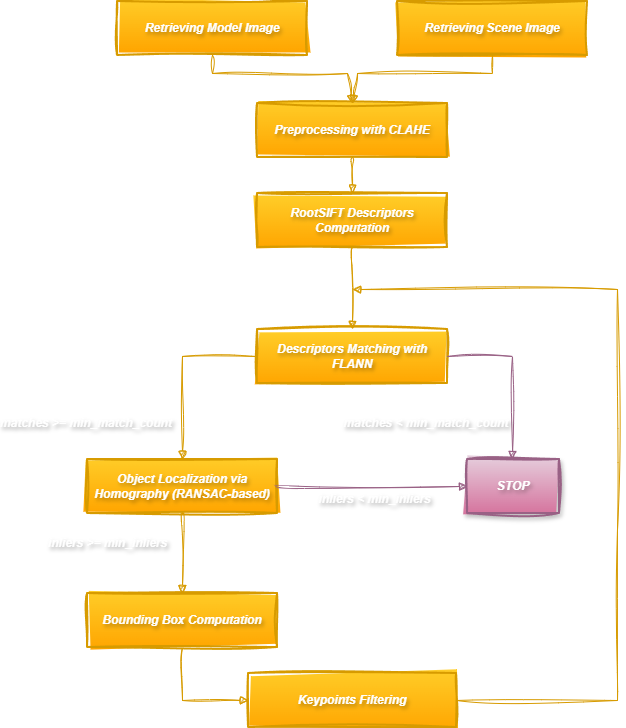

# Pipeline Implementation

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd
import os

## 1. Data Retrieval and Analysis

This section handles loading and organizing the dataset used in our experiments.
We define paths to the model images (book covers) and scene images (shelf photographs) and collect all relevant image files in a structured and sorted manner.

Sorting ensures that the model and scene images are consistently indexed, avoiding mismatches caused by string-based ordering (e.g., "model_10.png" appearing before "model_2.png").

After loading, we print the number of images in each category to verify that the dataset has been correctly prepared.

In [ ]:
models_dir = Path("dataset/models/")
scene_dir = Path("dataset/scenes/")

models_paths = sorted(
    models_dir.glob("*.png"),
    key= lambda p: int(p.stem.split("_")[1])
)

scene_paths = sorted(
    scene_dir.glob("*.jpg"),
    key= lambda p: int(p.stem.split("_")[1])
)

print(f"Model images: {len(models_paths)}")
print(f"Scene images: {len(scene_paths)}")

Model images: 22
Scene images: 29


### Exploratory Data Analysis (EDA)

In this section, before processing we analyze the dimensions and aspect ratios of both model and scene images.

Model images (book covers) typically appear tall and narrow, reflecting the physical shape of book spines, while scene images are uniform in size (640×640 pixels), simplifying subsequent processing.

These observations suggest that the detection pipeline must handle variable reference dimensions while applying preprocessing and feature extraction. The consistent scene image size simplifies processing, but special attention is needed for the tall and narrow reference models to ensure robust keypoint detection and matching.

In [ ]:
def image_size_eda(image_paths, title= "Image Size EDA"):

    sizes = []
    for idx, path in enumerate(image_paths):
        img = cv2.imread(str(path))
        if img is not None:
            h, w = img.shape[:2]
            aspect_ratio = w / h
            sizes.append({"Index": idx, "Filename": path.name, "Width": w, "Height": h, "Aspect Ratio": aspect_ratio})

    df = pd.DataFrame(sizes)

    fig, axes = plt.subplots(1, 2, figsize=(14,6))
    fig.suptitle(title, fontsize=16)

    axes[0].scatter(df["Width"], df["Height"], color="skyblue")
    for i, row in df.iterrows():
        axes[0].text(row["Width"], row["Height"], str(row["Index"]), fontsize=9, color="black")
    axes[0].set_xlabel("Width (pixels)")
    axes[0].set_ylabel("Height (pixels)")
    axes[0].set_title("Width vs Height")
    axes[0].grid(True)


    axes[1].hist(df["Aspect Ratio"], bins=20, color="salmon", edgecolor="black")
    axes[1].set_xlabel("Aspect Ratio (Width / Height)")
    axes[1].set_ylabel("Count")
    axes[1].set_title("Aspect Ratio Distribution")

    plt.tight_layout()
    plt.show()

    return df

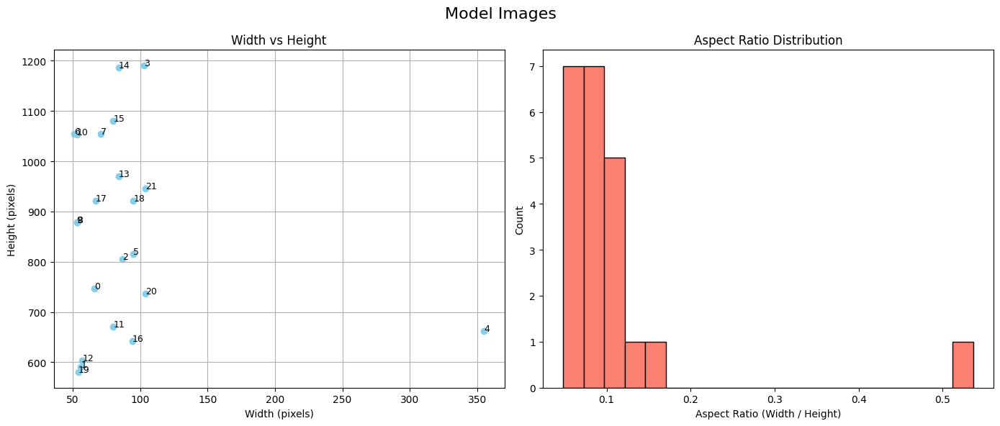

In [ ]:
models_df = image_size_eda(models_paths, title="Model Images")

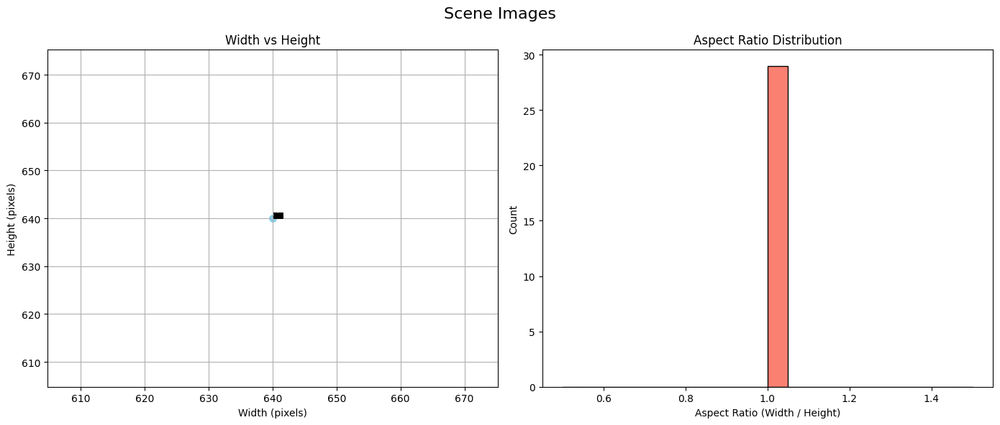

In [ ]:
scene_df = image_size_eda(scene_paths, title="Scene Images")

### Visualization Functions

This section defines helper functions to load, display, and compare images, facilitating both qualitative inspection and debugging.

In [ ]:
def load_image_rgb(path):
    img = cv2.imread(path)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def show_image(img):
    plt.imshow(img)
    plt.show()

def img_comparison(img1, img2, title1, title2):
    fig, axes = plt.subplots(1, 2, figsize=(15, 8))

    axes[0].imshow(img1)
    axes[0].set_title(title1)
    axes[0].axis("off")

    axes[1].imshow(img2)
    axes[1].set_title(title2)
    axes[1].axis("off")

    plt.show()

def show_model_vs_shelf(models, shelves, title):
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(title, fontsize=16)

    for i, ax in enumerate(axes[0]):
        if i < len(models):
            img = models[i]
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            ax.set_title(f"Model {i}")
        ax.axis("off")

    for i, ax in enumerate(axes[1]):
        if i < len(shelves):
            img = shelves[i]
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            ax.set_title(f"Scene {i}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()

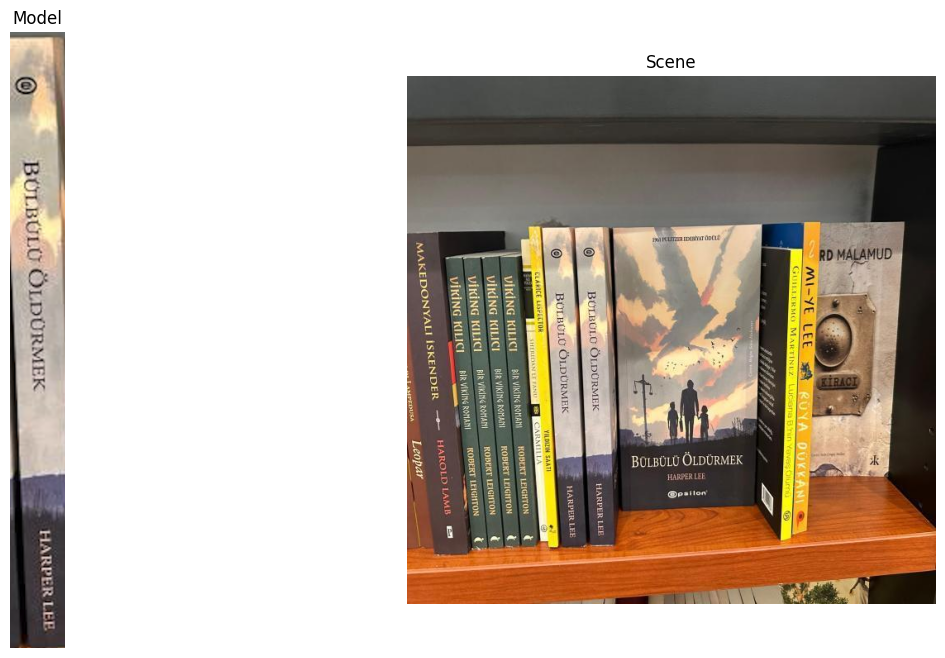

In [ ]:
model_example_img = load_image_rgb(models_paths[0])
scene_example_img = load_image_rgb(scene_paths[26])

img_comparison(model_example_img, scene_example_img, "Model", "Scene")

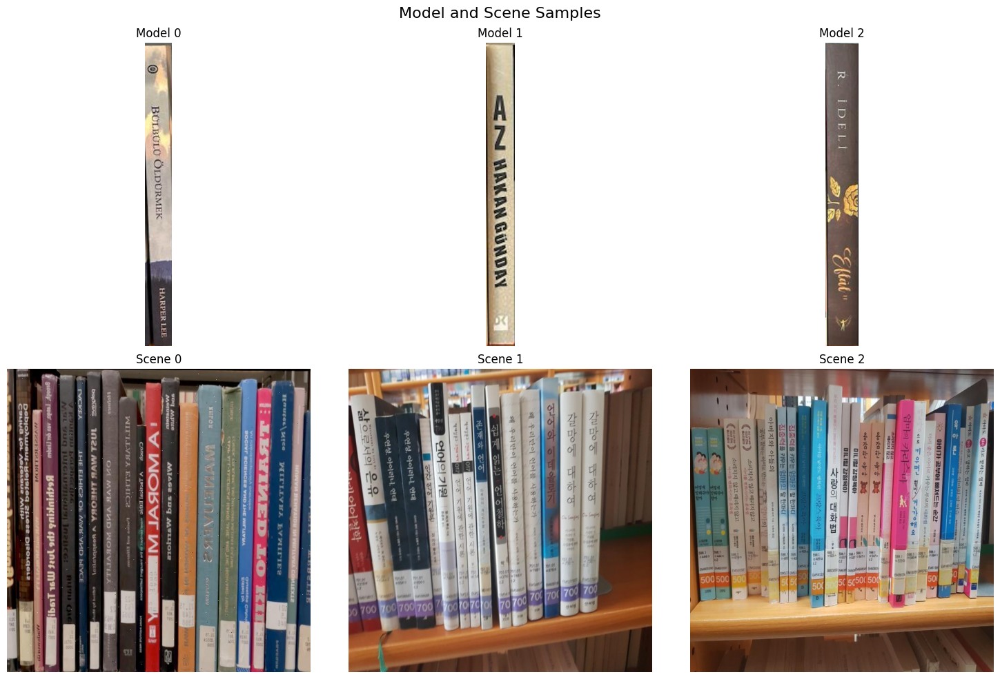

In [ ]:
models = [cv2.imread(str(p)) for p in models_paths[:3]]
shelves = [cv2.imread(str(p)) for p in scene_paths[:3]]

show_model_vs_shelf(models, shelves, title="Model and Scene Samples")

## 2. Preprocessing of the image with CLAHE

Uneven lighting and low contrast in images can negatively affect the detection of robust features. To mitigate this, we apply CLAHE (Contrast Limited Adaptive Histogram Equalization), which enhances local contrast while preventing over-amplification of noise in uniform regions.

The processing steps are as follows: images are first converted to LAB color space, CLAHE is applied to the L (lightness) channel, and the enhanced L channel is merged back with the original A and B channels before converting the image back to RGB.

By visualizing the results with the img_comparison function, it is evident that our choice helped achieve improvements in contrast, having subtle details apperaing more clear. This enhancement facilitates the extraction of distinctive and reliable keypoints, improving the overall robustness of the feature matching pipeline.

In [ ]:
def apply_CLAHE(img_rgb,
                clipLimit= 2.0, tileGridSize = (4, 4)):

    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)

    clahe = cv2.createCLAHE(clipLimit= clipLimit,
                            tileGridSize= tileGridSize)
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))

    return  cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)

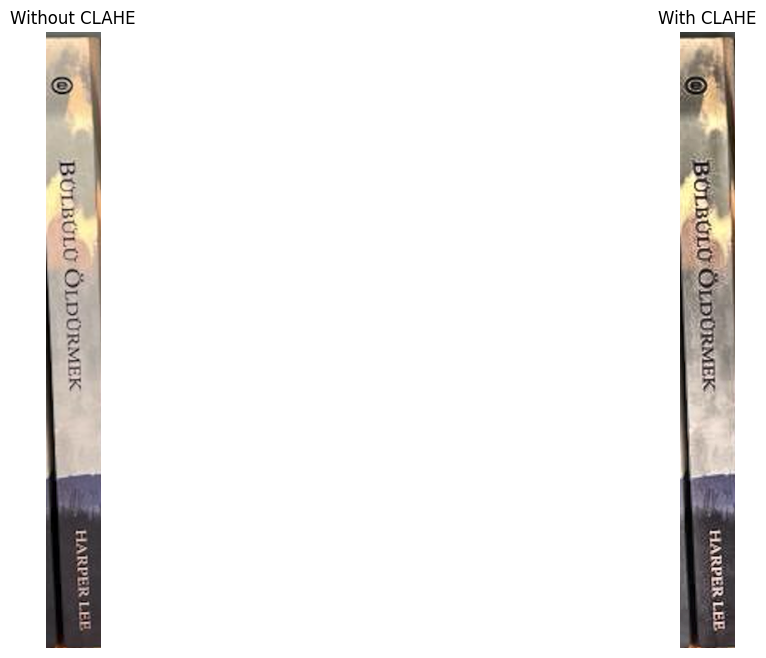

In [ ]:
model_example_clahe_img = apply_CLAHE(model_example_img)

img_comparison(model_example_img, model_example_clahe_img, "Without CLAHE", "With CLAHE")

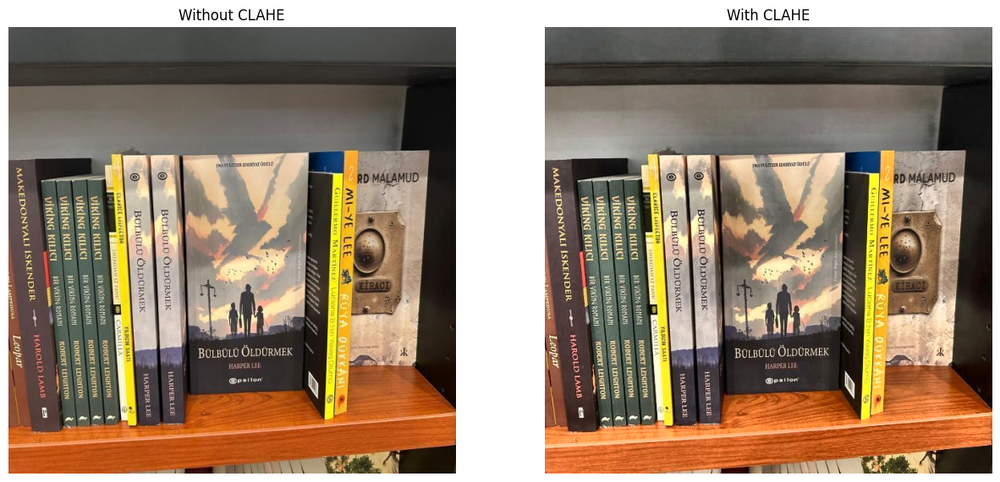

In [ ]:
scene_example_clahe_img = apply_CLAHE(scene_example_img)

img_comparison(scene_example_img, scene_example_clahe_img, "Without CLAHE", "With CLAHE")

## 3. RootSIFT Keypoints Detection

In this stage, we extract local features from both model and scene images using SIFT (Scale-Invariant Feature Transform). SIFT identifies keypoints that are invariant to scale, rotation, and moderate changes in illumination, providing reliable descriptors for matching.

The detector is controlled by parameters such as the number of octaves, the contrast and edge thresholds, and the initial Gaussian smoothing, which together influence the number, stability, and distribution of keypoints.

After computing SIFT descriptors, we apply RootSIFT, which normalizes each descriptor and applies an element-wise square root, emphasizing subtle gradients and improving robustness under varying lighting conditions.

$$
\mathbf{RootSIFT}(x) = \sqrt{\frac{x}{\|x\|_{1} + \varepsilon}} \quad \text{( element-wise operation)}
$$

Comparing keypoints detected with and without CLAHE shows that contrast enhancement produces more keypoints, better distributed across the image, and reveals finer details that are otherwise hard to detect. This ensures that subsequent descriptor matching is more accurate and reliable.

In [ ]:
def compute_SIFT(image, nfeatures= 0, nOctaveLayers= 3, contrastThreshold= 0.04, edgeThreshold= 10, sigma= 1.6):

    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    sift = cv2.SIFT_create(nfeatures= nfeatures,
                           nOctaveLayers= nOctaveLayers,
                           contrastThreshold= contrastThreshold,
                           edgeThreshold= edgeThreshold,
                           sigma= sigma)

    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors

def compute_rootSIFT(descriptors):
    eps = 1e-7
    descriptors /= (np.linalg.norm(descriptors, ord= 1, axis= 1, keepdims= True) + eps)

    return np.sqrt(descriptors)

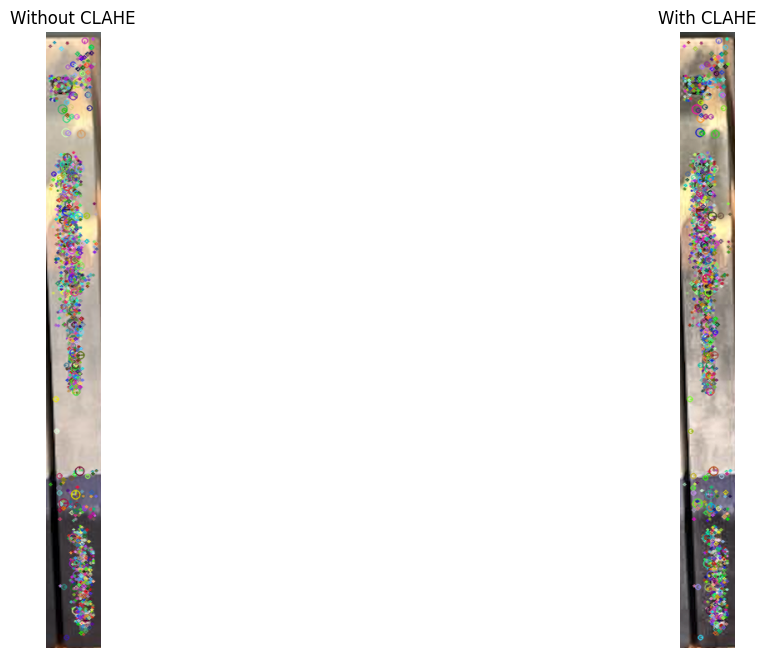

Found 1447 keypoints in the image without CLAHE
Found 2319 keypoints in the image with CLAHE


In [ ]:
kp_model_example, des_model_example = compute_SIFT(model_example_img,
                                                   nfeatures= 0,
                                                   nOctaveLayers= 7,
                                                   contrastThreshold= 0.02,
                                                   edgeThreshold= 10,
                                                   sigma= 0.8)

kp_model_example_clahe, des_model_example_clahe = compute_SIFT(model_example_clahe_img,
                                                               nfeatures= 0,
                                                               nOctaveLayers= 7,
                                                               contrastThreshold= 0.02,
                                                               edgeThreshold= 10,
                                                               sigma= 0.8)

img_visualization_example = cv2.drawKeypoints(model_example_img,
                                              kp_model_example,
                                              None,
                                              flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

img_visualization_example_clahe = cv2.drawKeypoints(model_example_clahe_img,
                                                    kp_model_example,
                                                    None,
                                                    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

img_comparison(img_visualization_example, img_visualization_example_clahe, "Without CLAHE", "With CLAHE")

print(f"Found {len(kp_model_example)} keypoints in the image without CLAHE")
print(f"Found {len(kp_model_example_clahe)} keypoints in the image with CLAHE")

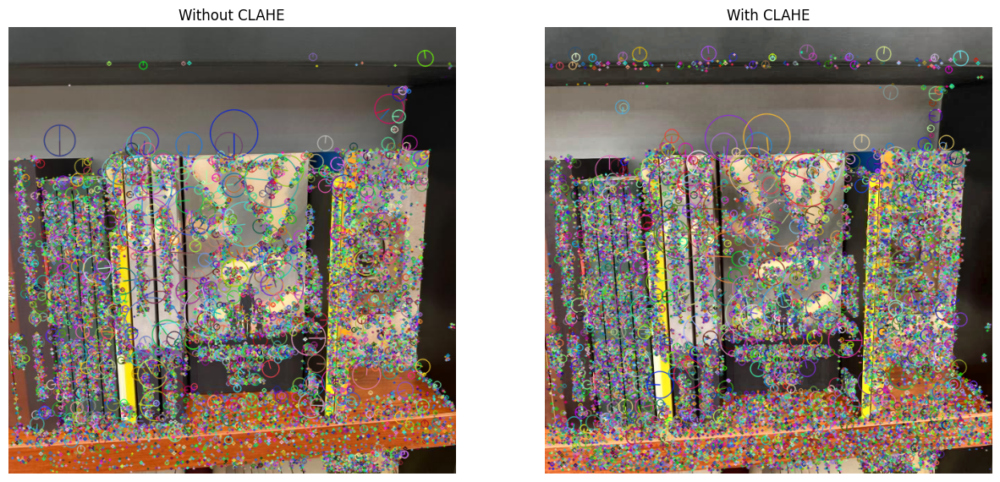

Found 25769 keypoints in the image without CLAHE
Found 34059 keypoints in the image with CLAHE


In [ ]:
kp_scene_example, des_scene_example = compute_SIFT(scene_example_img,
                                                   nfeatures= 0,
                                                   nOctaveLayers= 7,
                                                   contrastThreshold= 0.02,
                                                   edgeThreshold= 10,
                                                   sigma= 0.8)

kp_scene_example_clahe, des_scene_example_clahe = compute_SIFT(scene_example_clahe_img,
                                                               nfeatures= 0,
                                                               nOctaveLayers= 7,
                                                               contrastThreshold= 0.02,
                                                               edgeThreshold= 10,
                                                               sigma= 0.8)

img_visualization_example = cv2.drawKeypoints(scene_example_img,
                                              kp_scene_example,
                                              None,
                                              flags= cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

img_visualization_example_clahe = cv2.drawKeypoints(scene_example_clahe_img,
                                                    kp_scene_example_clahe,
                                                    None,
                                                    flags= cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

img_comparison(img_visualization_example, img_visualization_example_clahe, "Without CLAHE", "With CLAHE")

print(f"Found {len(kp_scene_example)} keypoints in the image without CLAHE")
print(f"Found {len(kp_scene_example_clahe)} keypoints in the image with CLAHE")

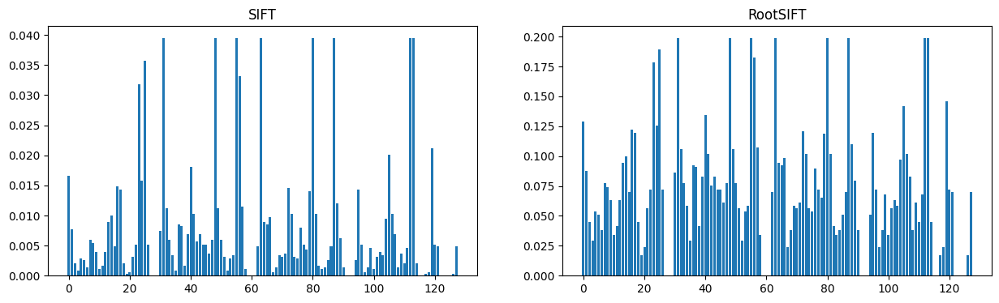

In [ ]:
root_des_model_example = compute_rootSIFT(des_model_example)
root_des_model_example_clahe = compute_rootSIFT(des_model_example_clahe)
root_des_scene_example = compute_rootSIFT(des_scene_example)
root_des_scene_example_clahe = compute_rootSIFT(des_scene_example_clahe)

fig, axs = plt.subplots(1, 2, figsize=(15,4))

axs[0].bar(range(128), des_scene_example_clahe[0])
axs[0].set_title("SIFT")

axs[1].bar(range(128), root_des_scene_example_clahe[0])
axs[1].set_title("RootSIFT")

plt.show()

## 4. Descriptor Matching with FLANN

Once keypoints and RootSIFT descriptors are extracted, correspondences between model and scene features are established using a FLANN-based matcher. FLANN (Fast Library for Approximate Nearest Neighbors) efficiently searches for nearest neighbors in high-dimensional descriptor space. The KD-Tree algorithm is employed here, with parameters controlling the number of trees and search iterations to balance speed and matching accuracy.

For each descriptor in the model, the two closest matches in the scene are retrieved, and Lowe’s ratio test is applied to retain only high-confidence matches, filtering out ambiguous or false correspondences. The resulting set of good matches provides the foundation for estimating geometric transformations and detecting the object in the scene.

These good matches are visualized by drawing lines connecting corresponding keypoints in the model and scene images, offering a qualitative assessment of matching quality before proceeding to homography estimation.


In [ ]:
def match_descriptors(des_model, des_scene, ratio_thresh = 0.75, trees = 5, checks = 50):

    FLANN_INDEX_KDTREE = 1
    flann = cv2.FlannBasedMatcher(dict(algorithm= FLANN_INDEX_KDTREE, trees= trees), dict(checks= checks))
    matches = flann.knnMatch(des_model, des_scene, k= 2)
    good = [m for m, n in matches if m.distance < ratio_thresh * n.distance]

    return good

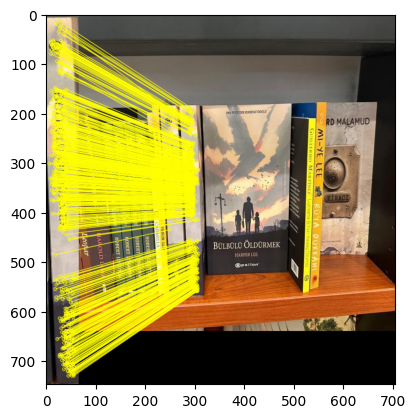

Found 540 good matches



In [ ]:
good_matches = match_descriptors(root_des_model_example_clahe,
                                 root_des_scene_example_clahe,
                                 ratio_thresh = 0.68,
                                 trees = 10,
                                 checks = 100)

draw_params = dict(
    matchColor=(255, 255, 0),
    singlePointColor= None,
    flags= 2
)

show_image(cv2.drawMatches(model_example_img,
                           kp_model_example_clahe,
                           scene_example_img,
                           kp_scene_example_clahe,
                           good_matches,
                           None,
                           **draw_params))

print(f"Found {len(good_matches)} good matches\n")

## 5. Object Localization via Homography (RANSAC-based)
After obtaining robust matches between the model and scene keypoints, we estimate a homography that maps points from the model image to the scene. Keypoint coordinates are extracted from both images, and the transformation is computed using RANSAC, which iteratively selects random subsets of matches to fit the homography while rejecting outliers. The reprojection threshold determines how far a projected point can deviate before being considered an outlier.


In [ ]:
def find_homography(img_model, kp_model, kp_scene, good_matches, ransac_reproj_threshold= 2.0):

    src_pts = np.float32([kp_model[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_reproj_threshold)
    matches_mask = mask.ravel().tolist() if mask is not None else None

    return M, matches_mask

In [ ]:
H, matches_mask = find_homography(model_example_clahe_img,
                                  kp_model_example_clahe,
                                  kp_scene_example_clahe,
                                  good_matches,
                                  ransac_reproj_threshold= 2)

print(f"Found {sum(matches_mask)} good masked matches\n")

Found 498 good masked matches



## 6. Bounding Box Computation

Once a valid homography is obtained, the corners of the model image are projected into the scene, forming a bounding polygon around the detected object. Drawing this polygon on the scene image allows visual verification of detection. Importantly, highlighting the inlier matches not only provides a clear indication of alignment quality and localization reliability, but also serves as a criterion for computing the bounding box: only when a sufficient number of inliers is found is the polygon drawn, ensuring that the detected region is trustworthy.

In [ ]:
def compute_bounding_box(M, img_model):
    h, w = img_model.shape[:2]
    pts = np.float32([[0,0], [0,h-1], [w-1,h-1], [w-1,0]]).reshape(-1, 1, 2)

    if M is not None:
      bound_box = cv2.perspectiveTransform(pts, M)
    else:
      bound_box = None

    return bound_box

The following functions are helper utilities related to bounding box computation. The first overlays the detected object on the scene image by drawing its quadrilateral bounding box using the estimated corner coordinates, making it easier to visually inspect the localization result. The second computes the area of the bounding box using the shoelace formula, providing a quantitative measure of the detected object's scale within the scene.

In [ ]:
def draw_bounding_box(img_scene, bounding_box, color=(0, 255, 0), thickness=3):
    img_out = img_scene.copy()

    if bounding_box is not None:
        img_out = cv2.polylines(img_out, [np.int32(bounding_box)], True, color, thickness, cv2.LINE_AA)

    return img_out

def compute_bounding_box_area(bounding_box):
    quad = bounding_box.squeeze()
    area = 0.5 * abs(np.sum(quad[:, 0] * np.roll(quad[:, 1], -1) -
                            quad[:, 1] * np.roll(quad[:, 0], -1)))
    return area

Detected Match: True


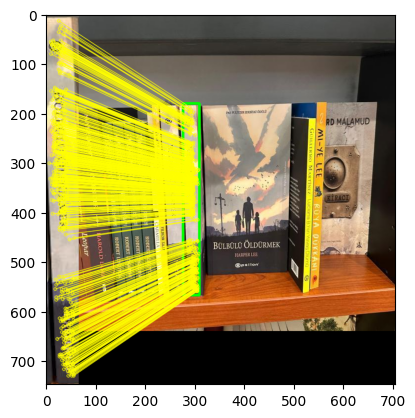

In [ ]:
masked_draw_params = dict(
    matchColor=(255, 255, 0),
    singlePointColor= None,
    matchesMask= matches_mask,
    flags=2
)

min_inliers = 10
num_inliers = sum(matches_mask)
if(num_inliers >= min_inliers):
    bound_box = compute_bounding_box(H, model_example_clahe_img)
    scene_example_img = draw_bounding_box(scene_example_img, bound_box, (0, 255, 0))

    print("Detected Match: True")
    show_image(cv2.drawMatches(model_example_img,
                               kp_model_example_clahe,
                               scene_example_img,
                               kp_scene_example_clahe,
                               good_matches,
                               None,
                               **masked_draw_params))
else:
    print("Detected Match: False")

## 7. Keypoints Filtering

The following function removes keypoints and descriptors that lie inside a given bounding box. The box can be optionally shrunk toward its centroid using shrink_hor and shrink_ver. Each keypoint is tested and only those outside the polygon are retained. This allows iterative detection by ignoring regions already matched, improving the detection of multiple objects in the same scene.


In [ ]:
def filter_keypoints_outside_bounding_box(kp, des, bounding_box, shrink_hor= 1.0, shrink_ver= 1.0):

    kp_filtered = []
    des_filtered = []

    if bounding_box.shape[1] == 1:
        bounding_box = bounding_box.reshape(-1, 2)

    center = np.mean(bounding_box, axis= 0)
    shrunk = bounding_box.copy().astype(np.float32)
    shrunk[:, 0] = (shrunk[:, 0] - center[0]) * shrink_hor + center[0]
    shrunk[:, 1] = (shrunk[:, 1] - center[1]) * shrink_ver + center[1]
    shrunk = shrunk.astype(np.int32)

    for k, d in zip(kp, des):
        x, y = k.pt
        inside = cv2.pointPolygonTest(shrunk, (x, y), False) >= 0
        if not inside:
            kp_filtered.append(k)
            des_filtered.append(d)

    des_filtered = np.array(des_filtered) if len(des_filtered) > 0 else None
    return kp_filtered, des_filtered

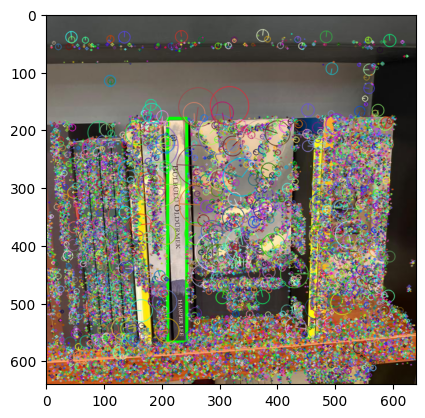

In [ ]:
kp_scene_example_clahe, des_scene_example_clahe = filter_keypoints_outside_bounding_box(kp_scene_example_clahe,
                                                                                        des_scene_example_clahe,
                                                                                        bound_box)

show_image(cv2.drawKeypoints(scene_example_img,
                             kp_scene_example_clahe,
                             None,
                             flags= cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS))

# Tests and Results

## 1. Parameters

In [ ]:
parameters = {

    # ==== CLAHE parameters ====
    "clipLimit": 2.0,
    "tileGridSize": (8, 8),

    # ==== SIFT parameters ====
    "octave": 7,
    "contrastThreshold": 0.02,
    "edgeThreshold": 10,
    "sigma": 0.8,

    # ==== FLANN parameters ====
    "ratio_thresh": 0.68,
    "trees": 10,
    "checks": 100,

    # ==== RANSAC parameters ====
    "ransac_reproj_threshold": 2,

    # ==== Matching Validation parameters ====
    "min_match_count": 20,
    "min_inliers": 10,

    # ==== Filtering parameters ====
    "shrink_hor": 1,
    "shrink_ver": 1,
}

In [ ]:
COLOR_LIST = [
    (0, 255, 0),     # green
    (255, 0, 0),     # red
    (255, 0, 255),   # magenta
    (0, 0, 255),     # blue
    (0, 255, 255),   # yellow
    (255, 255, 0),   # cyan
    (255, 255, 255), # white
    (0, 0, 0),       # black
]

## 2. Iterative Model Detection in Scene

The function below manages the complete detection pipeline, systematically identifying and localizing all instances of a given model within a scene, and returning a list of bounding boxes corresponding to each detected occurrence.


In [ ]:
def detect_model_in_scene(model_path, scene_path, params):

    detected_bounding_box = []
    count = 0

    model_img = load_image_rgb(model_path)
    scene_img = load_image_rgb(scene_path)

    model_img = apply_CLAHE(model_img,
                            clipLimit= params["clipLimit"],
                            tileGridSize= params["tileGridSize"])

    scene_img = apply_CLAHE(scene_img,
                            clipLimit= params["clipLimit"],
                            tileGridSize= params["tileGridSize"])

    kp_scene, des_scene = compute_SIFT(scene_img,
                                       nfeatures= 0,
                                       nOctaveLayers= params["octave"],
                                       contrastThreshold= params["contrastThreshold"],
                                       edgeThreshold= params["edgeThreshold"],
                                       sigma = params["sigma"])
    kp_model, des_model = compute_SIFT(model_img,
                                       nfeatures= 0,
                                       nOctaveLayers= params["octave"],
                                       contrastThreshold= params["contrastThreshold"],
                                       edgeThreshold= params["edgeThreshold"],
                                       sigma = params["sigma"])

    des_model = compute_rootSIFT(des_model)
    des_scene = compute_rootSIFT(des_scene)


    while(True):
        good_matches = match_descriptors(des_model,
                                         des_scene,
                                         ratio_thresh= params["ratio_thresh"],
                                         trees= params["trees"],
                                         checks= params["checks"])

        num_matches = len(good_matches)
        if (num_matches < params["min_match_count"]):
            break

        H, matches_mask = find_homography(model_img,
                                          kp_model,
                                          kp_scene,
                                          good_matches,
                                          ransac_reproj_threshold= params["ransac_reproj_threshold"])

        num_inliers = np.sum(np.array(matches_mask).ravel().astype(bool))
        if(num_inliers < params["min_inliers"]):
            break

        bound_box = compute_bounding_box(H, model_img)
        count += 1
        detected_bounding_box.append(bound_box)

        kp_scene, des_scene = filter_keypoints_outside_bounding_box(kp_scene, des_scene, bound_box,
                                                                    shrink_hor= params["shrink_hor"],
                                                                    shrink_ver= params["shrink_ver"])

    return detected_bounding_box

## 3. Multi-Model Detection and Visualization

This function extends the detection pipeline to handle multiple models within a single scene. For each model, the previous function is called to find all instances, and bounding boxes are computed for each detected object, eventually clipped to avoid negative coordinates.

After processing all models, the function visualizes the results in a subplot grid: the first column shows the annotated scene with all detected objects, and the remaining columns display the individual model images corresponding to the detected instances, colored consistently with their bounding boxes.


In [ ]:
def detect_models_in_scene(scene, models= models_paths):

    print(f"Scene {scene}")

    scene_path = scene_paths[scene]
    scene_img = load_image_rgb(scene_path)
    color = 0
    detected_models = []

    for i in range(len(models)):
        cv2.setRNGSeed(84)
        bounding_boxes = detect_model_in_scene(models[i], scene_path, parameters)

        if len(bounding_boxes) != 0:
            detected_models.append((i, load_image_rgb(models_paths[i])))
            n_instances = len(bounding_boxes)

            if n_instances == 1:
                print(f"\tBook {i} - {n_instances} instance found:")
            else:
                print(f"\tBook {i} - {n_instances} instances found:")

            for j in range(len(bounding_boxes)):
                bounding_boxes[j][bounding_boxes[j] < 0] = 0
                raveled_bounding_boxes = bounding_boxes[j].ravel()

                print(f"\t\tInstance {j+1} "
                      f"{{top_left: ({round(raveled_bounding_boxes[0])}, {round(raveled_bounding_boxes[1])}), bottom_left: ({round(raveled_bounding_boxes[2])}, {round(raveled_bounding_boxes[3])}), bottom_right: ({round(raveled_bounding_boxes[4])}, {round(raveled_bounding_boxes[5])}), top_right: ({round(raveled_bounding_boxes[6])}, {round(raveled_bounding_boxes[7])})}}, area: {round(compute_bounding_box_area(bounding_boxes[j]))} px}}")

                scene_img = draw_bounding_box(scene_img, bounding_boxes[j], COLOR_LIST[color % len(COLOR_LIST)], thickness=5)

            color += 1

    n_models = len(detected_models)

    if n_models > 0:
        n_cols = n_models + 1
        fig, axes = plt.subplots(1, n_cols, figsize=(4*n_cols, 5))

        axes[0].imshow(scene_img)
        axes[0].set_title(f"scene_{scene}.jpg")
        axes[0].axis("off")

        for i in range(len(detected_models)):
            axes[i+1].imshow(detected_models[i][1])
            axes[i+1].set_title(f"model_{detected_models[i][0]}.png", color= tuple(c/255 for c in COLOR_LIST[i % len(COLOR_LIST)]))
            axes[i+1].axis("off")

        plt.tight_layout()
        plt.show()
        print("\n\n")

    else:
        print("\tNo instances found\n")


## 4. Complete Results

Finally, this section is reported to visualize the results of the entire dataset, running the previous function across all the scenes.



Scene 0
	No instances found

Scene 1
	Book 18 - 2 instances found:
		Instance 1 {top_left: (442, 43), bottom_left: (442, 521), bottom_right: (490, 521), top_right: (490, 43)}, area: 23312 px}
		Instance 2 {top_left: (490, 40), bottom_left: (482, 517), bottom_right: (530, 518), top_right: (537, 40)}, area: 22790 px}


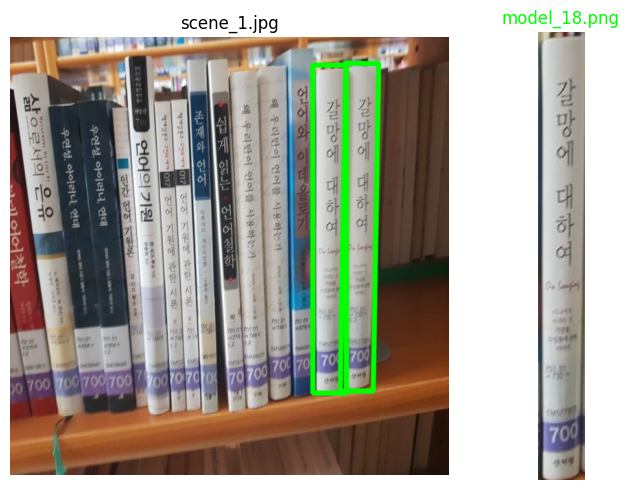




Scene 2
	Book 17 - 1 instance found:
		Instance 1 {top_left: (284, 26), bottom_left: (284, 503), bottom_right: (318, 503), top_right: (318, 25)}, area: 16322 px}


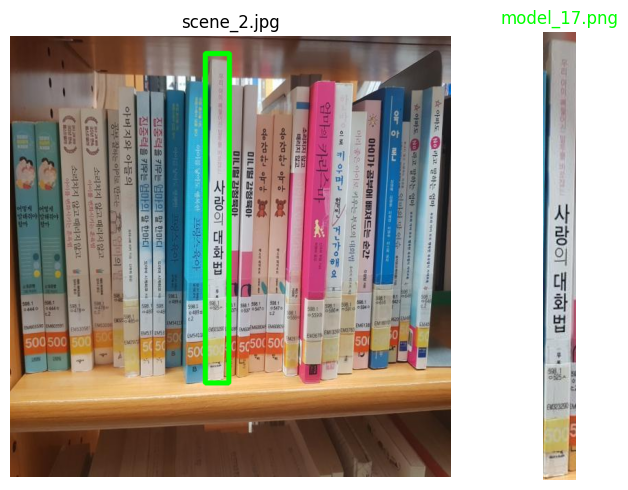




Scene 3
	Book 16 - 2 instances found:
		Instance 1 {top_left: (377, 210), bottom_left: (377, 542), bottom_right: (425, 542), top_right: (425, 210)}, area: 16038 px}
		Instance 2 {top_left: (426, 211), bottom_left: (418, 550), bottom_right: (467, 548), top_right: (474, 209)}, area: 16493 px}


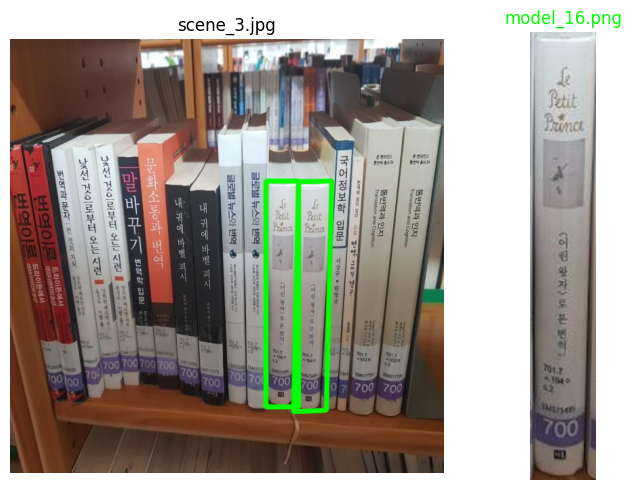




Scene 4
	Book 14 - 2 instances found:
		Instance 1 {top_left: (92, 2), bottom_left: (92, 617), bottom_right: (135, 617), top_right: (135, 2)}, area: 26443 px}
		Instance 2 {top_left: (56, 0), bottom_left: (60, 612), bottom_right: (103, 624), top_right: (99, 0)}, area: 26720 px}
	Book 15 - 2 instances found:
		Instance 1 {top_left: (227, 49), bottom_left: (227, 609), bottom_right: (268, 609), top_right: (268, 49)}, area: 22960 px}
		Instance 2 {top_left: (192, 44), bottom_left: (197, 610), bottom_right: (239, 609), top_right: (234, 45)}, area: 23564 px}


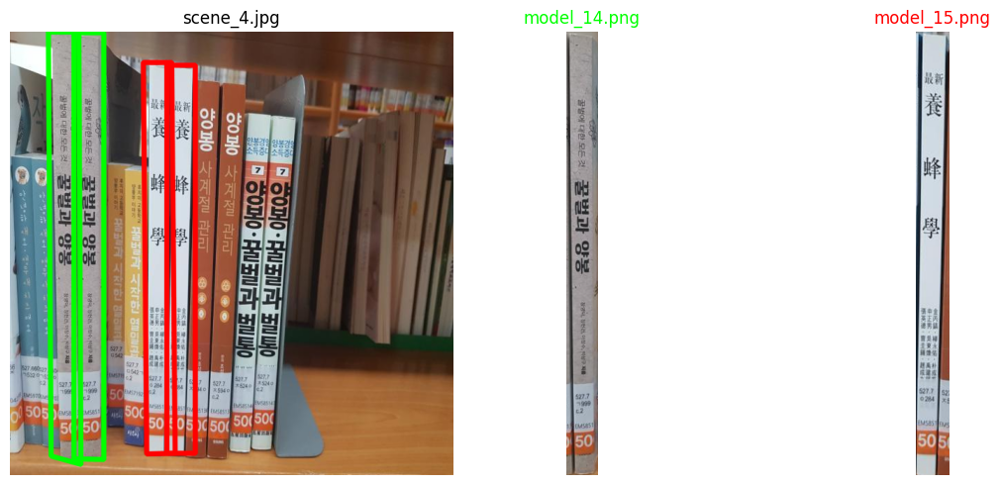




Scene 5
	Book 13 - 1 instance found:
		Instance 1 {top_left: (103, 70), bottom_left: (103, 573), bottom_right: (146, 573), top_right: (146, 70)}, area: 21640 px}


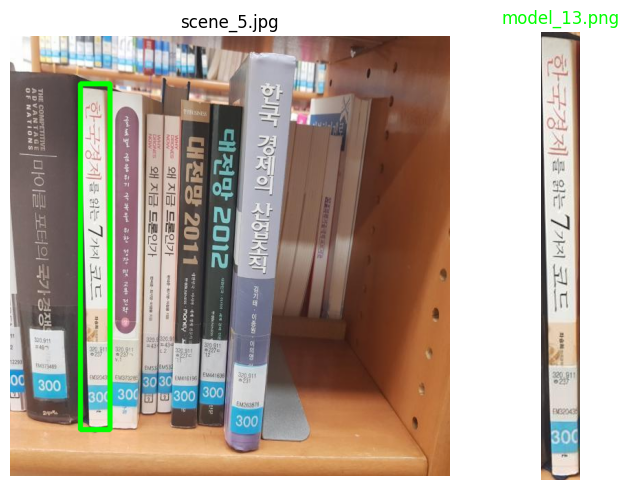




Scene 6
	Book 21 - 1 instance found:
		Instance 1 {top_left: (217, 73), bottom_left: (217, 564), bottom_right: (271, 564), top_right: (271, 74)}, area: 26054 px}


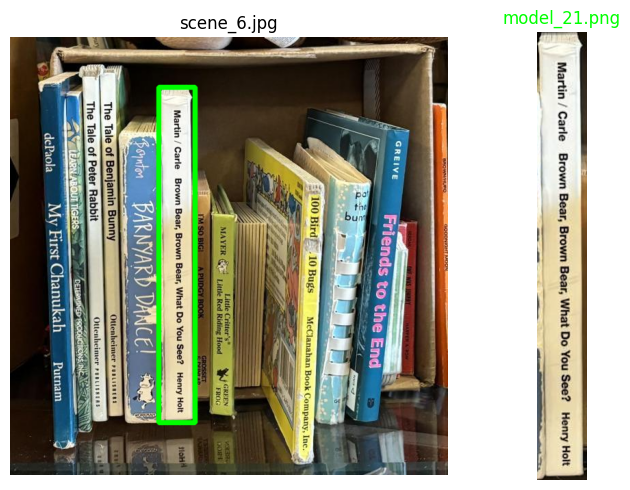




Scene 7
	Book 20 - 2 instances found:
		Instance 1 {top_left: (236, 173), bottom_left: (236, 555), bottom_right: (290, 555), top_right: (290, 173)}, area: 20423 px}
		Instance 2 {top_left: (279, 170), bottom_left: (275, 562), bottom_right: (330, 561), top_right: (335, 172)}, area: 21541 px}


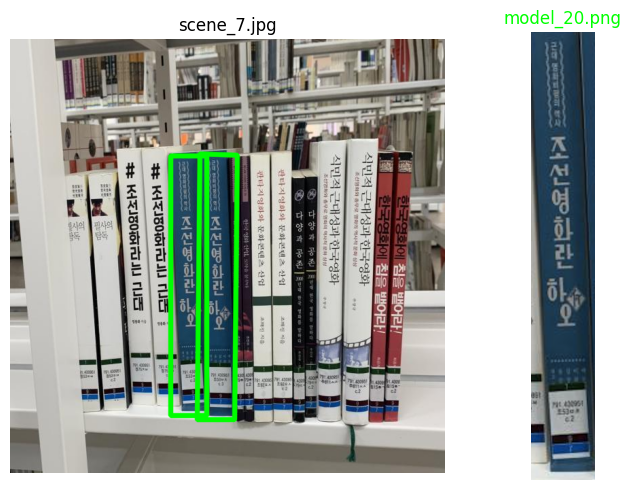




Scene 8
	No instances found

Scene 9
	Book 19 - 4 instances found:
		Instance 1 {top_left: (438, 329), bottom_left: (137, 339), bottom_right: (139, 366), top_right: (439, 356)}, area: 8244 px}
		Instance 2 {top_left: (443, 381), bottom_left: (140, 390), bottom_right: (143, 420), top_right: (443, 411)}, area: 8938 px}
		Instance 3 {top_left: (436, 305), bottom_left: (140, 312), bottom_right: (124, 340), top_right: (439, 332)}, area: 8484 px}
		Instance 4 {top_left: (453, 353), bottom_left: (119, 365), bottom_right: (178, 390), top_right: (435, 383)}, area: 8360 px}


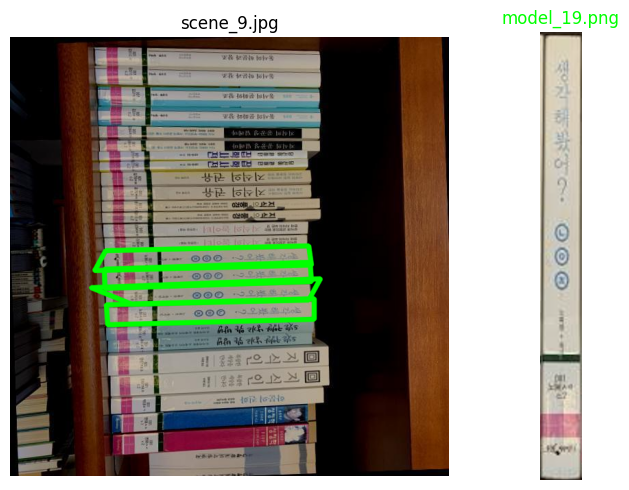




Scene 10
	Book 19 - 4 instances found:
		Instance 1 {top_left: (332, 203), bottom_left: (332, 504), bottom_right: (360, 504), top_right: (360, 203)}, area: 8249 px}
		Instance 2 {top_left: (308, 202), bottom_left: (306, 505), bottom_right: (333, 506), top_right: (335, 203)}, area: 8297 px}
		Instance 3 {top_left: (362, 202), bottom_left: (361, 501), bottom_right: (386, 512), top_right: (386, 204)}, area: 7469 px}
		Instance 4 {top_left: (385, 199), bottom_left: (385, 506), bottom_right: (413, 498), top_right: (414, 202)}, area: 8662 px}


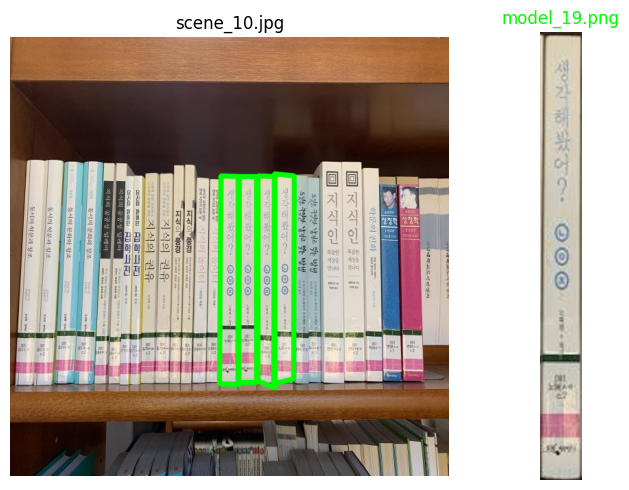




Scene 11
	No instances found

Scene 12
	No instances found

Scene 13
	No instances found

Scene 14
	No instances found

Scene 15
	Book 11 - 2 instances found:
		Instance 1 {top_left: (258, 188), bottom_left: (252, 535), bottom_right: (292, 536), top_right: (298, 188)}, area: 14166 px}
		Instance 2 {top_left: (218, 182), bottom_left: (212, 537), bottom_right: (253, 527), top_right: (260, 186)}, area: 14212 px}
	Book 12 - 3 instances found:
		Instance 1 {top_left: (500, 214), bottom_left: (495, 527), bottom_right: (524, 528), top_right: (529, 215)}, area: 9117 px}
		Instance 2 {top_left: (525, 216), bottom_left: (519, 516), bottom_right: (547, 521), top_right: (555, 215)}, area: 8841 px}
		Instance 3 {top_left: (474, 214), bottom_left: (468, 515), bottom_right: (498, 530), top_right: (505, 212)}, area: 9449 px}


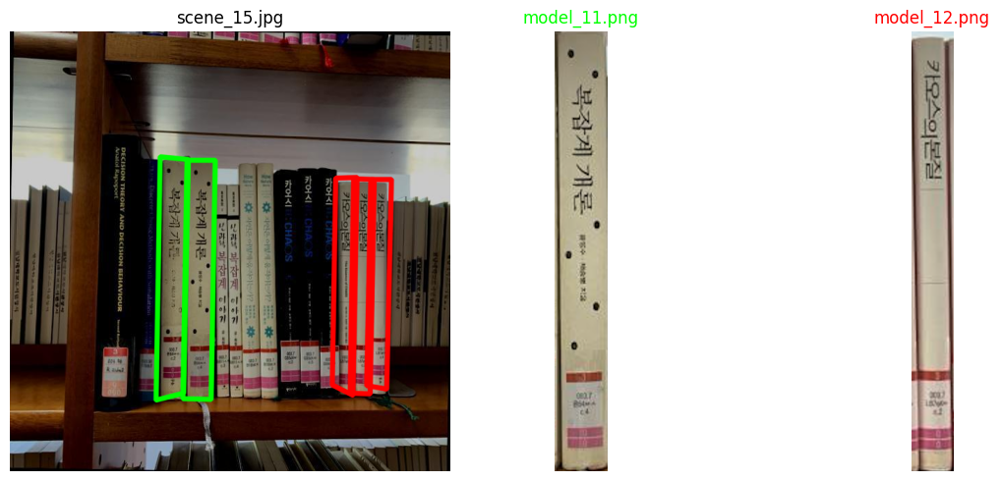




Scene 16
	Book 11 - 2 instances found:
		Instance 1 {top_left: (258, 188), bottom_left: (251, 534), bottom_right: (292, 536), top_right: (299, 187)}, area: 14251 px}
		Instance 2 {top_left: (219, 184), bottom_left: (210, 563), bottom_right: (255, 556), top_right: (259, 188)}, area: 15877 px}
	Book 12 - 3 instances found:
		Instance 1 {top_left: (500, 214), bottom_left: (495, 527), bottom_right: (524, 527), top_right: (529, 215)}, area: 8975 px}
		Instance 2 {top_left: (473, 213), bottom_left: (464, 532), bottom_right: (498, 536), top_right: (506, 214)}, area: 10767 px}
		Instance 3 {top_left: (524, 216), bottom_left: (518, 528), bottom_right: (549, 531), top_right: (555, 216)}, area: 9708 px}


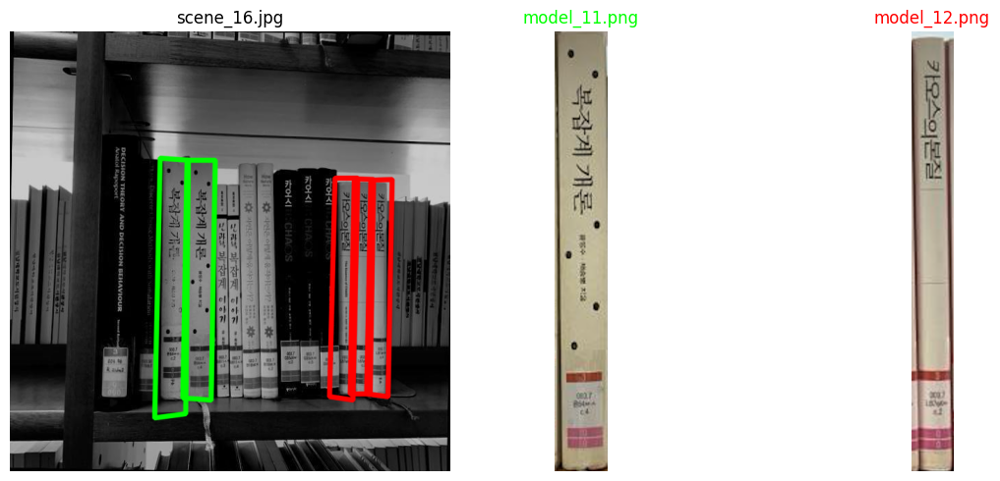




Scene 17
	Book 11 - 2 instances found:
		Instance 1 {top_left: (255, 188), bottom_left: (255, 536), bottom_right: (296, 536), top_right: (296, 188)}, area: 14242 px}
		Instance 2 {top_left: (216, 188), bottom_left: (213, 562), bottom_right: (260, 566), top_right: (257, 188)}, area: 16469 px}
	Book 12 - 3 instances found:
		Instance 1 {top_left: (498, 211), bottom_left: (498, 524), bottom_right: (527, 524), top_right: (527, 211)}, area: 8995 px}
		Instance 2 {top_left: (523, 212), bottom_left: (522, 523), bottom_right: (551, 524), top_right: (551, 211)}, area: 8976 px}
		Instance 3 {top_left: (472, 212), bottom_left: (471, 528), bottom_right: (504, 550), top_right: (502, 208)}, area: 10361 px}


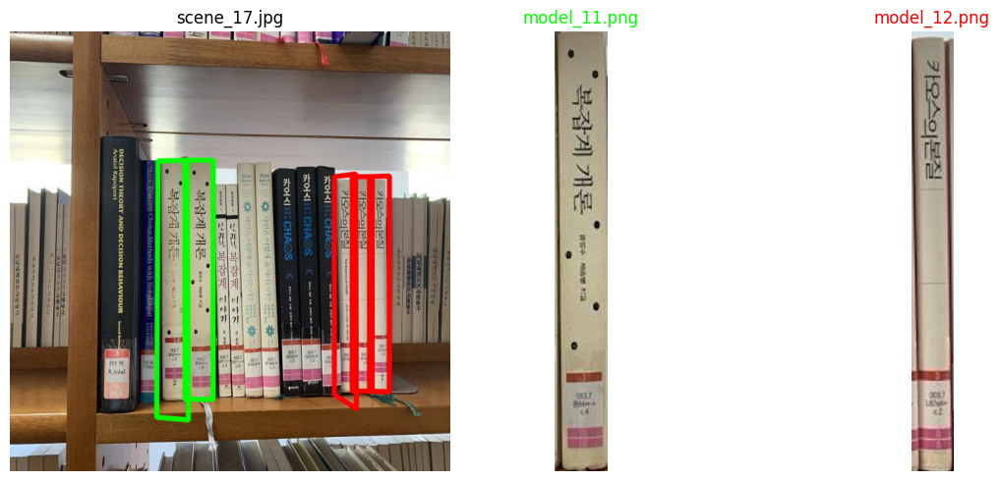




Scene 18
	Book 8 - 3 instances found:
		Instance 1 {top_left: (291, 131), bottom_left: (291, 587), bottom_right: (318, 587), top_right: (318, 131)}, area: 12281 px}
		Instance 2 {top_left: (315, 133), bottom_left: (317, 587), bottom_right: (344, 587), top_right: (342, 133)}, area: 12183 px}
		Instance 3 {top_left: (266, 121), bottom_left: (263, 609), bottom_right: (291, 576), top_right: (293, 135)}, area: 12882 px}
	Book 9 - 3 instances found:
		Instance 1 {top_left: (316, 131), bottom_left: (316, 586), bottom_right: (342, 586), top_right: (342, 131)}, area: 12245 px}
		Instance 2 {top_left: (292, 128), bottom_left: (289, 586), bottom_right: (316, 585), top_right: (319, 128)}, area: 12180 px}
		Instance 3 {top_left: (267, 125), bottom_left: (263, 583), bottom_right: (290, 585), top_right: (294, 125)}, area: 12384 px}
	Book 10 - 3 instances found:
		Instance 1 {top_left: (109, 39), bottom_left: (109, 585), bottom_right: (136, 585), top_right: (136, 39)}, area: 14727 px}
		Instance 2 

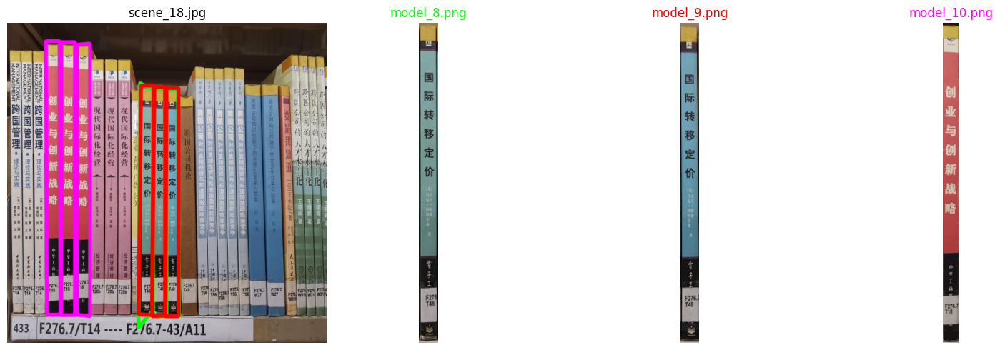




Scene 19
	Book 6 - 3 instances found:
		Instance 1 {top_left: (385, 32), bottom_left: (385, 579), bottom_right: (411, 580), top_right: (411, 32)}, area: 14139 px}
		Instance 2 {top_left: (439, 25), bottom_left: (439, 578), bottom_right: (464, 577), top_right: (464, 27)}, area: 13861 px}
		Instance 3 {top_left: (412, 27), bottom_left: (410, 579), bottom_right: (435, 575), top_right: (437, 31)}, area: 13792 px}
	Book 7 - 2 instances found:
		Instance 1 {top_left: (497, 40), bottom_left: (497, 588), bottom_right: (533, 587), top_right: (533, 40)}, area: 19815 px}
		Instance 2 {top_left: (458, 45), bottom_left: (460, 582), bottom_right: (496, 584), top_right: (494, 43)}, area: 19373 px}


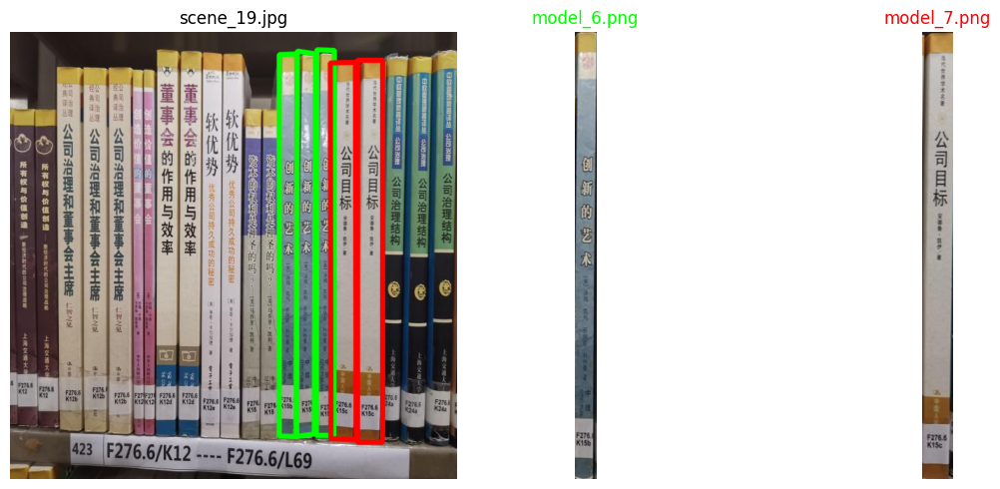




Scene 20
	No instances found

Scene 21
	No instances found

Scene 22
	No instances found

Scene 23
	Book 5 - 1 instance found:
		Instance 1 {top_left: (342, 149), bottom_left: (342, 572), bottom_right: (391, 572), top_right: (391, 149)}, area: 20615 px}


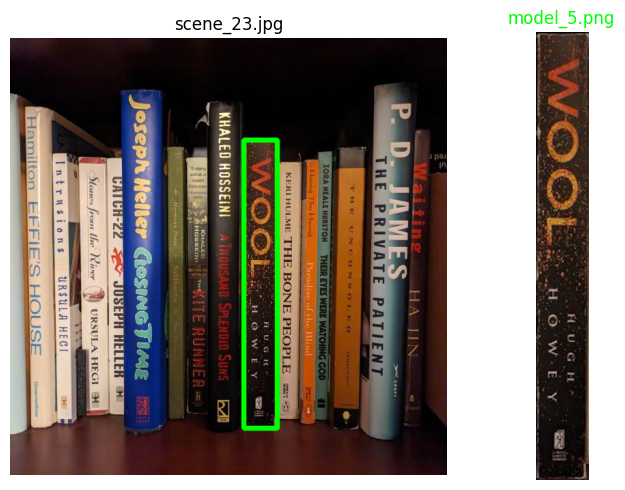




Scene 24
	No instances found

Scene 25
	No instances found

Scene 26
	Book 0 - 2 instances found:
		Instance 1 {top_left: (210, 181), bottom_left: (210, 568), bottom_right: (244, 568), top_right: (244, 180)}, area: 13004 px}
		Instance 2 {top_left: (170, 182), bottom_left: (176, 571), bottom_right: (210, 572), top_right: (204, 181)}, area: 13278 px}
	Book 4 - 1 instance found:
		Instance 1 {top_left: (249, 183), bottom_left: (249, 526), bottom_right: (432, 526), top_right: (432, 183)}, area: 63040 px}


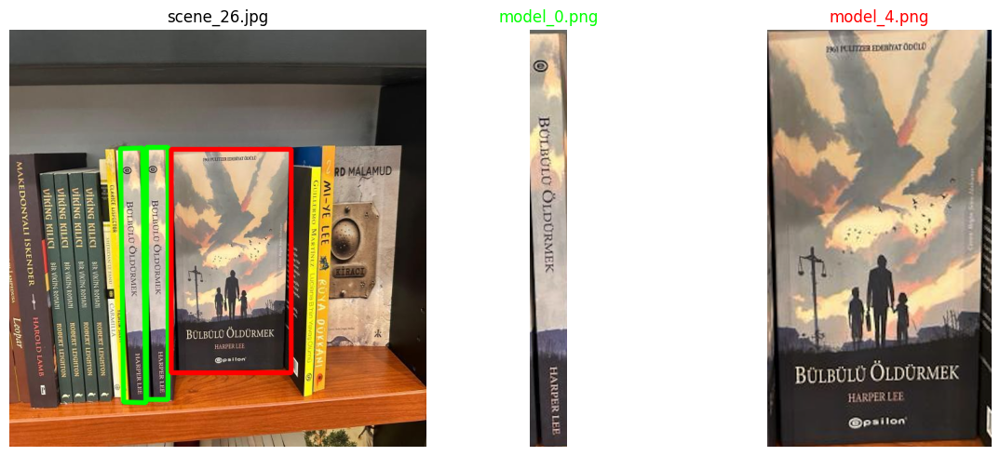




Scene 27
	Book 2 - 2 instances found:
		Instance 1 {top_left: (258, 146), bottom_left: (258, 564), bottom_right: (302, 564), top_right: (302, 146)}, area: 18619 px}
		Instance 2 {top_left: (317, 106), bottom_left: (299, 583), bottom_right: (350, 587), top_right: (368, 117)}, area: 24250 px}
	Book 3 - 2 instances found:
		Instance 1 {top_left: (416, 143), bottom_left: (401, 566), bottom_right: (449, 566), top_right: (466, 143)}, area: 20705 px}
		Instance 2 {top_left: (364, 125), bottom_left: (354, 578), bottom_right: (404, 580), top_right: (422, 91)}, area: 25264 px}


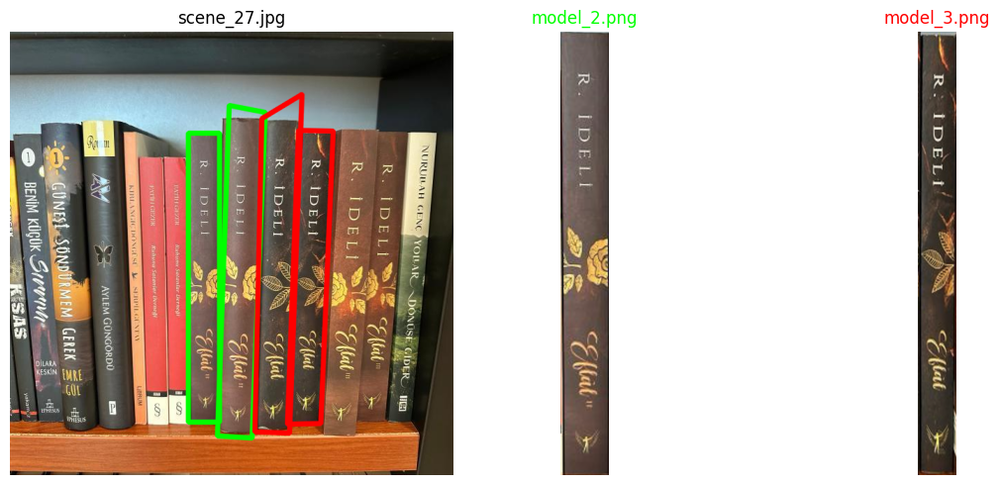




Scene 28
	Book 1 - 2 instances found:
		Instance 1 {top_left: (207, 248), bottom_left: (207, 554), bottom_right: (235, 554), top_right: (235, 248)}, area: 8696 px}
		Instance 2 {top_left: (238, 246), bottom_left: (237, 551), bottom_right: (265, 551), top_right: (265, 247)}, area: 8339 px}


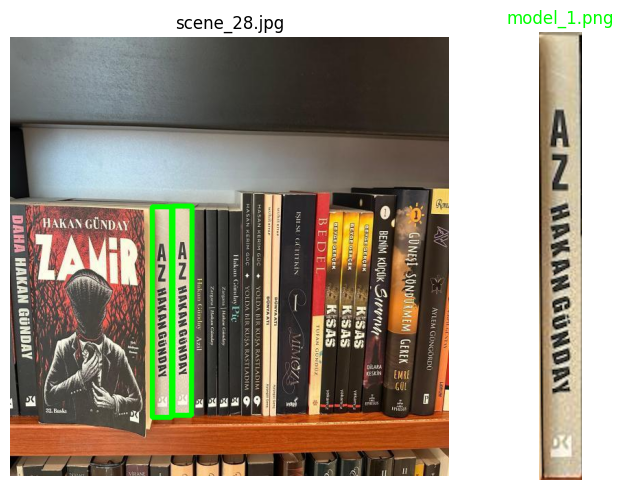

In [ ]:
for i in range(0, len(scene_paths)):
  detect_models_in_scene(i)

## 5. Evaluations and Conclusions

The results demonstrate the effectiveness of the pipeline in detecting models within scenes, showing robust performance across the dataset. While all matches were successfully found, differences between easier and harder scenes were observed.

Since most model images were cropped from existing scenes, multiple-object detection performed particularly well for the selected parts, whereas nearby objects sometimes introduced noise—for example, books adjacent to the target were occasionally included in bounding boxes, and secondary matches sometimes aligned with other spines.

CLAHE was applied to both scene and model images to normalize contrast and improve feature visibility. This is beneficial not only when model images are cropped regions of scenes but also for general model images, which may still suffer from illumination variability or low contrast. Applying the same preprocessing step to both scene and model images ensures consistent feature extraction and improves the robustness of the matching process.

After testing various configurations, we opted to extract a large number of keypoints to capture fine details that help distinguish visually similar models, such as books from the same series. While this increases the number of detected keypoints, some of which may be outliers, it was essential for improving matching accuracy in challenging cases. The pipeline was tuned for this dataset, but its modular design allows adaptation to similar scenarios, ensuring robustness even when objects share many visual features.

Performance complexity increased as we prioritized accuracy over execution speed and memory efficiency, for example by using higher FLANN parameters *(checks = 100, trees = 10)*. This configuration enhanced the precision and robustness of the feature matching process, but consequently led to longer computation times and greater memory usage.

Since RANSAC is inherently non-deterministic due to its random sampling strategy, repeated executions can yield slightly different sets of inliers and projection estimates. To mitigate this stochastic variability and ensure that differences in the results are attributable to methodological changes rather than randomness, a fixed random seed was later introduced.

Bounding box estimation performed reasonably well: while some boxes were affected by noise and minor reprojection errors, the results were generally reliable and sufficiently precise.

As a consequence of our experiments on keypoint distribution, we initially included in the filter function the option to shrink the bounding box before filtering, aiming to reduce multiple matches within the same instance. However, we observed that some instances contained a significant number of informative keypoints along the perimeter. To preserve these features while still controlling duplicate matches, we ultimately decided to retain the bounding boxes at their full size.

Overall, establishing this pipeline provides a strong and clear baseline for the task. Object detection is performed effectively, successfully handling challenging cases such as objects with similar appearances located in comparable positions on the shelves. The modular and well-structured design of the project ensures transparency and clarity, making it easy to understand, reproduce, and adapt to similar scenarios, while demonstrating a positive and effective approach to tackling the task